<a href="https://colab.research.google.com/github/normandoamazonas/FinalProject/blob/master/FinalProject.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [427]:
import imageio
import matplotlib.pyplot as plt
import numpy as np
from skimage import exposure, img_as_ubyte, color
from skimage.util import compare_images
from skimage.filters import threshold_otsu
from sklearn.cluster import KMeans
from mpl_toolkits.mplot3d import Axes3D

# Final Project
This is a final project for the Image Enhancement discipline, addressing the deforestation of the Amazon rainforest as a theme.

**Title:** Deforestation rates in the Amazon forest through satellite images

**Student:**

Normando de Campos Amazonas Filho, NUSP: 11561949

Robson Pessoa, NUSP: 8632563

**Abstract:** This project aims to try to identify and quantify the deforestation of the Amazon rainforest using as an example 2 comparative images (2000 and 2017) from a NASA LANDSAT satellite, where each pixel represents an area of 0.09 ha or 900m². This type of quantification where pixels are related to measurements is known as photogrammetry. The project will try to pass through 3 important phases: the first is pre-processing where the objective is to improve the image (eliminating noise through filters). The second phase is to define regions of interest and extract them (segmentation). Finally, the third phase consists of generating a statistic comparing the established metrics.

### **Read the satellite images**

As input resources, two satellite images from the Amazon Forest taken in 2000 and 2017 are going to be used to compare the devasted area in both timestamps to estimate the growth of the devastation.

Text(0.5, 1.0, 'LANDSAT 2017')

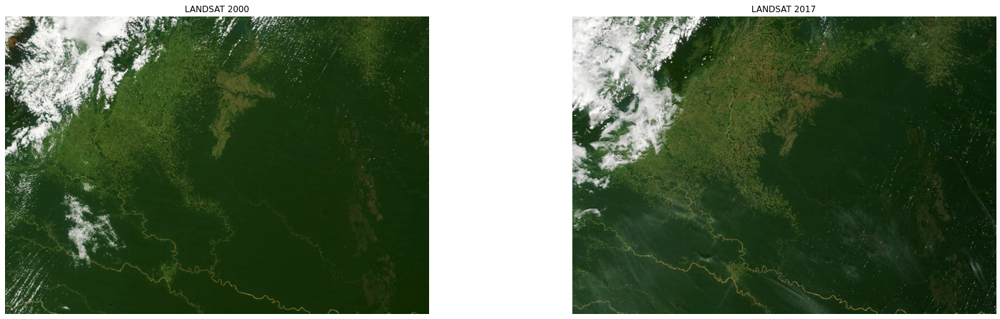

In [428]:
img2000 = imageio.imread("LANDSAT2000.png")
img2017 = imageio.imread("LANDSAT2017.png")

img2000 = np.array(img2000).astype(np.uint8)
img2017 = np.array(img2017).astype(np.uint8)

plt.figure(figsize=(26,26))
plt.subplot(321); plt.imshow(img2000); plt.axis('off'); plt.title('LANDSAT 2000')
plt.subplot(322); plt.imshow(img2017); plt.axis('off'); plt.title('LANDSAT 2017')

Because the images are in RGB mode, the filters may be applied in different color channels, so let's define some functions to load and plot each channel separately.

In [429]:
def get_rgb_channels(image):
  R = np.array(image[:,:,0])
  G = np.array(image[:,:,1])
  B = np.array(image[:,:,2])
  return R, G, B

def plot_rgb_channels(image, title):
  (R, G, B) = get_rgb_channels(image)
  plt.figure(figsize=(13,13))
  plt.subplot(323); plt.imshow(R, cmap="gray"); plt.axis('off'); plt.title('%s - Red Channel' % title)
  plt.subplot(324); plt.imshow(G, cmap="gray"); plt.axis('off'); plt.title('%s - Green Channel' % title)
  plt.subplot(325); plt.imshow(B, cmap="gray"); plt.axis('off'); plt.title('%s - Blue Channel' % title)

## Phase 1 - Pre-processing
### **Clouds Removal**

The first step to prepare the image is to remove the clouds. They are considered as noise for this work, because it does not aggregate value to the counting of forest area. 

The clouds have the highest values in the image, clearly. But to remove them, an analysis of the three RGB Channels may be necessary.


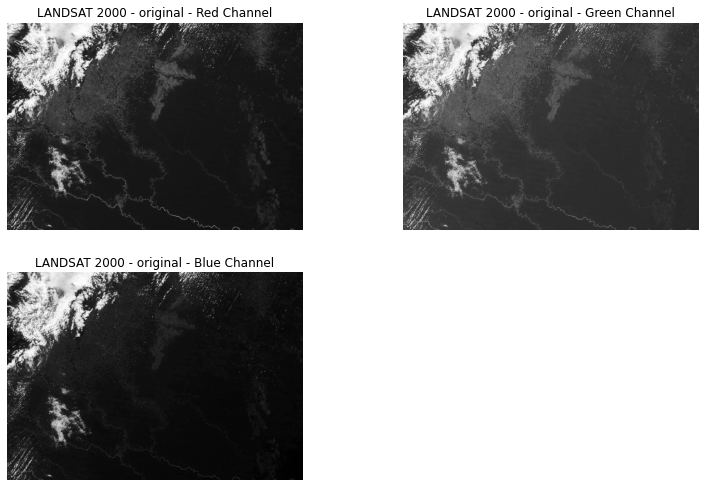

In [430]:
plot_rgb_channels(img2000, "LANDSAT 2000 - original")

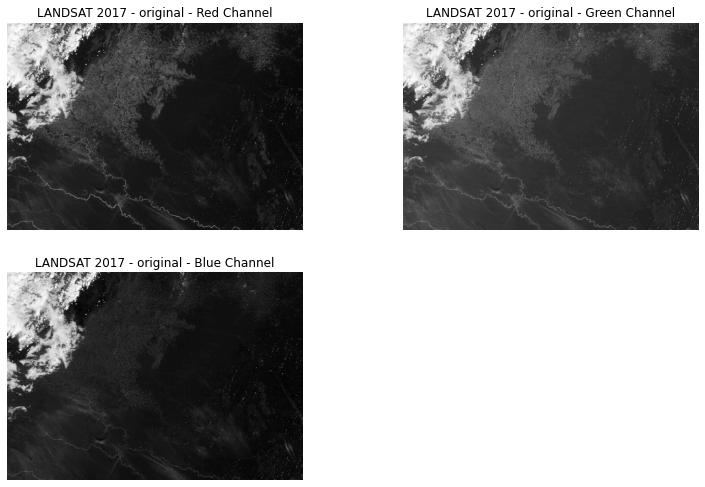

In [431]:
plot_rgb_channels(img2017, "LANDSAT 2017 - original")

The images of the RGB channels viewed separatelly shows that the clouds are represented in all of them. So the function that recovers the cloud area uses the high intensity values in this channel to compute them in the image.

The clouds can be considered as the foreground of the images in each channel. So the method to be applied has to remove the background of the image, leaving only the cloud area.

A good segmentation algorithm to split the foreground and background of the image is the Threshold Segmentation, yet the best coefficient to be employed as a threshold value can be defined in several ways. In this work, the OTSU method is used to calculate the optimal coefficient.

In [432]:
def get_clouds(image, channel = 2):
  X = get_rgb_channels(image)[channel]

  thresh = threshold_otsu(X)
  Y = np.array(X, copy=True)
  Y[Y < thresh] = 0

  print(thresh)

  return Y

### Getting clouds from the **Red** Channel

115
113


Text(0.5, 1.0, 'Cloud area in LANDSCAPE 2017 image')

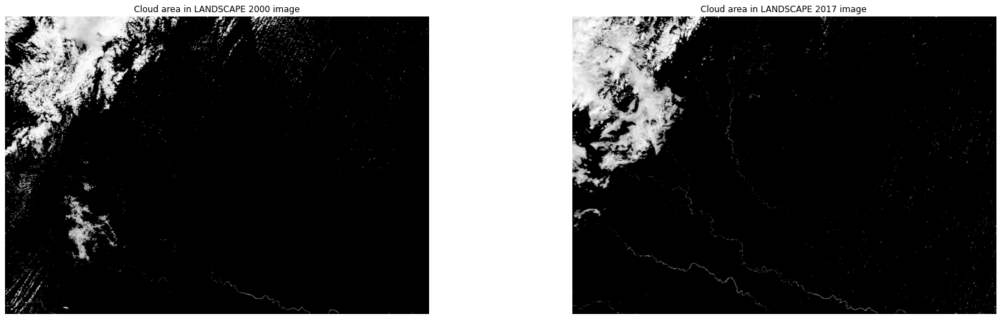

In [433]:
clouds_1 = get_clouds(img2000, 0)
clouds_2 = get_clouds(img2017, 0)

plt.figure(figsize=(26,26))
plt.subplot(323); plt.imshow(clouds_1, cmap="gray"); plt.axis('off'); plt.title('Cloud area in LANDSCAPE 2000 image')
plt.subplot(324); plt.imshow(clouds_2, cmap="gray"); plt.axis('off'); plt.title('Cloud area in LANDSCAPE 2017 image')

### Getting clouds from the **Green** Channel

129
125


Text(0.5, 1.0, 'Cloud area in LANDSCAPE 2017 image')

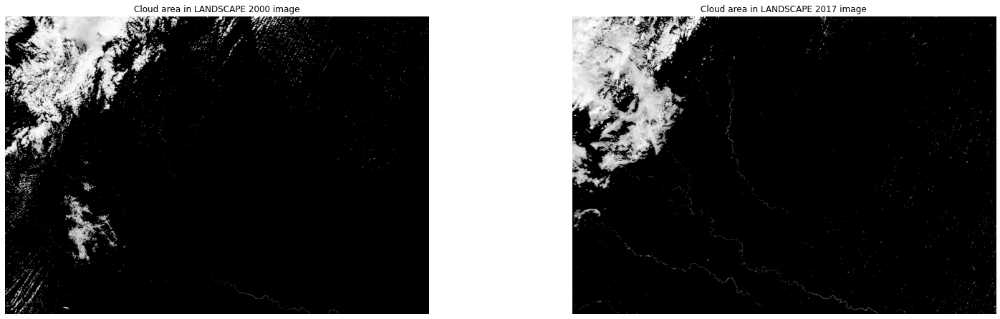

In [434]:
clouds_1 = get_clouds(img2000, 1)
clouds_2 = get_clouds(img2017, 1)

plt.figure(figsize=(26,26))
plt.subplot(323); plt.imshow(clouds_1, cmap="gray"); plt.axis('off'); plt.title('Cloud area in LANDSCAPE 2000 image')
plt.subplot(324); plt.imshow(clouds_2, cmap="gray"); plt.axis('off'); plt.title('Cloud area in LANDSCAPE 2017 image')

### Getting clouds from the **Blue** Channel

106
108


Text(0.5, 1.0, 'Cloud area in LANDSCAPE 2017 image')

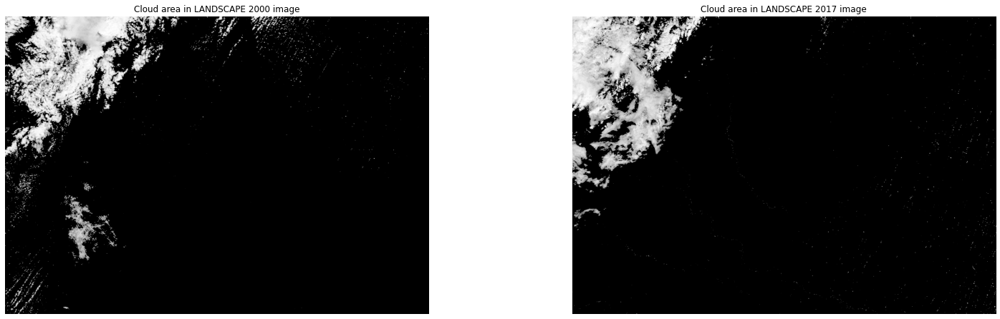

In [435]:
clouds_1 = get_clouds(img2000, 2)
clouds_2 = get_clouds(img2017, 2)

plt.figure(figsize=(26,26))
plt.subplot(323); plt.imshow(clouds_1, cmap="gray"); plt.axis('off'); plt.title('Cloud area in LANDSCAPE 2000 image')
plt.subplot(324); plt.imshow(clouds_2, cmap="gray"); plt.axis('off'); plt.title('Cloud area in LANDSCAPE 2017 image')

As the blue channel shows less noise compared to the other ones, it will be used for the next phases.

There is an important consideration to be made: the clouds in each image are different, as can be seen in the images above, but both of them cannot be used to calculate the deforestation area.

For this reason, the clouds region is considered as their union.

Text(0.5, 1.0, 'Area to be removed with the union of both cloud areas')

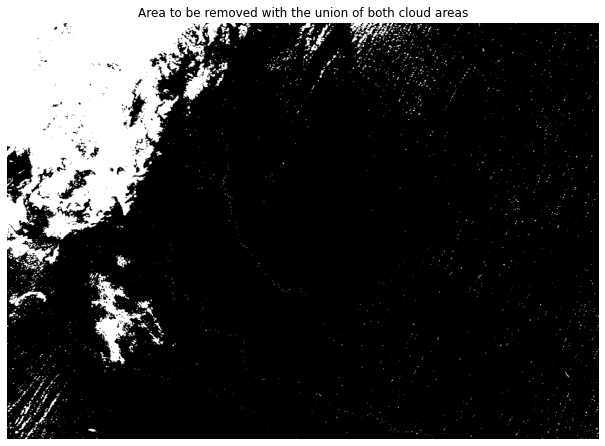

In [436]:
area = np.logical_or(clouds_1, clouds_2)

plt.figure(figsize=(26,26))
plt.subplot(323); plt.imshow(area, cmap="gray"); plt.axis('off'); plt.title('Area to be removed with the union of both cloud areas')

Now we can remove the indicated area from the images replacing them with the value 0 and then rescale the intensity values resulted into the range of 0 to 255.

In [437]:
def remove_area(image, area):
  (R, G, B) = get_rgb_channels(image)

  R[area] = 0
  G[area] = 0
  B[area] = 0

  removed = np.array(image, copy=True)
  removed[:,:,0] = R
  removed[:,:,1] = G
  removed[:,:,2] = B

  return exposure.rescale_intensity(removed)

img2000_1 = remove_area(img2000, area)
img2017_1 = remove_area(img2017, area)

Text(0.5, 1.0, 'LANDSAT 2000 - clouds removed')

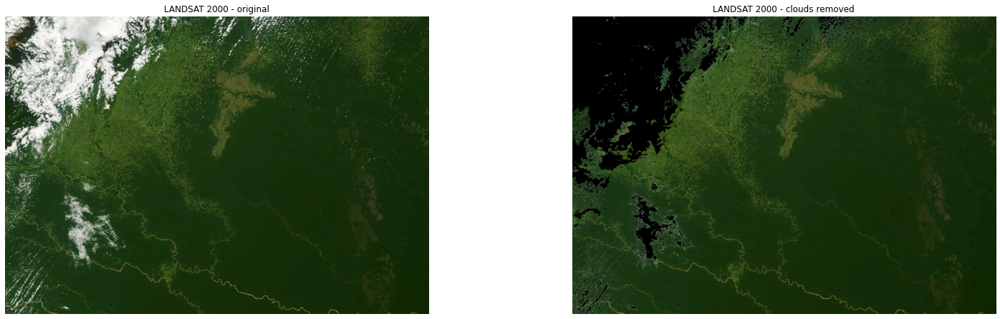

In [438]:
plt.figure(figsize=(26,26))
plt.subplot(323); plt.imshow(img2000); plt.axis('off'); plt.title('LANDSAT 2000 - original')
plt.subplot(324); plt.imshow(img2000_1); plt.axis('off'); plt.title('LANDSAT 2000 - clouds removed')

Text(0.5, 1.0, 'LANDSAT 2017 - clouds removed')

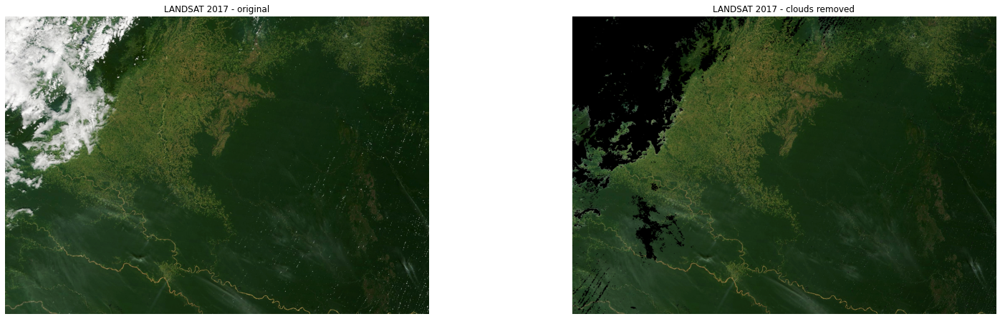

In [439]:
plt.figure(figsize=(26,26))
plt.subplot(323); plt.imshow(img2017); plt.axis('off'); plt.title('LANDSAT 2017 - original')
plt.subplot(324); plt.imshow(img2017_1); plt.axis('off'); plt.title('LANDSAT 2017 - clouds removed')

Both new images without clouds can be seen next.

Text(0.5, 1.0, 'LANDSAT 2017 - clouds removed')

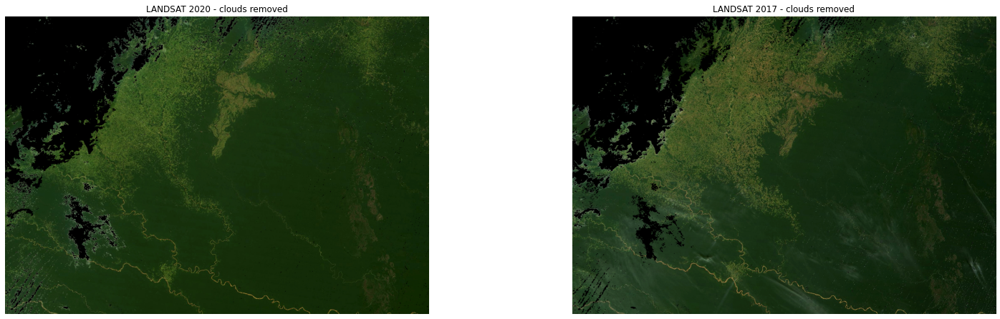

In [440]:
plt.figure(figsize=(26,26))
plt.subplot(323); plt.imshow(img2000_1); plt.axis('off'); plt.title('LANDSAT 2020 - clouds removed')
plt.subplot(324); plt.imshow(img2017_1); plt.axis('off'); plt.title('LANDSAT 2017 - clouds removed')

### **Increase contrast of deforested areas**

To delimitate the deforested areas, an Adaptive Histogram Equalization filter is applied on both images to saturate different regions of the image and increase the delimitation of the edges of some areas.

Different from the traditional Histogram Equalization, that uses the image histogram as base for the transformation filter applied in all pixels equally, this algorithm splits the image in several regions and creates different histograms for each one of them. Those are used to apply a histogram equalization filter in the regions separatelly. 

It's usage is recommended when there are high difference of intensity values in the image in specific regions, where the traditional histogram equalization does not work so well. Because the image can have a large forest area, this is the best approach to ignore their low intensity values and increase the contrast in the deforested areas.

A good coefficient, found to increase the contrast in both images, to be used as the clip limit (a value between 0 and 1) was 0.0077. The higher is the coefficient, higher is the contrast. But if a high value is chosen, some of the devasted areas are lost, becoming a black pixel as a result of the edge increase, so that a lower value was used.

In [441]:
def increase_contrast(img, title, value=0.008):
  # Adaptive Histogram Equalization
  result = exposure.equalize_adapthist(img, clip_limit=value)

  plt.figure(figsize=(26,26))
  plt.subplot(323); plt.imshow(result); plt.axis('off'); plt.title('%s - Adaptative Histogram Equalization Filter' % title)
  return result

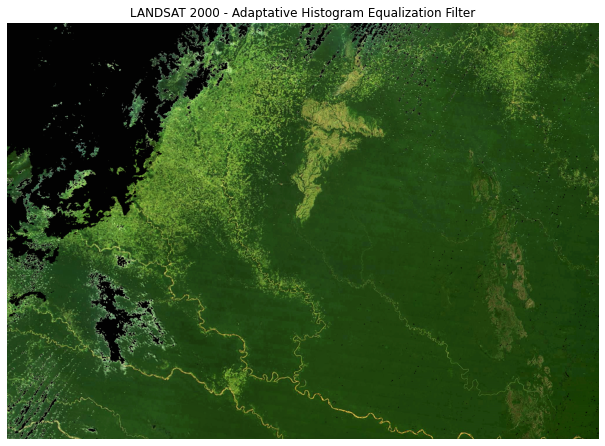

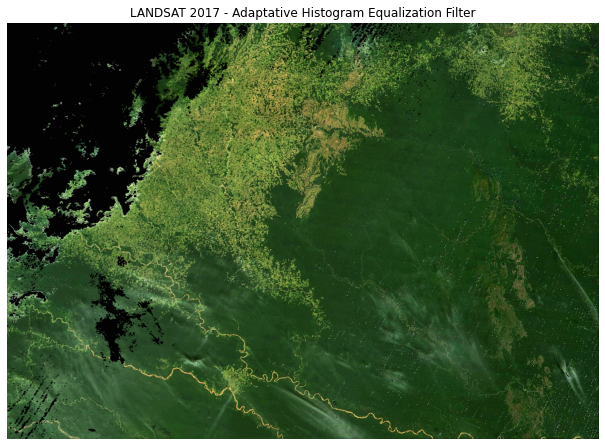

In [442]:
img2000_2 = increase_contrast(img2000_1, "LANDSAT 2000")
img2017_2 = increase_contrast(img2017_1, "LANDSAT 2017")

## Phase 2 - Segmentation
### **Extract deforested area from the images**

The result images obtained until now have high contrast, creating a sense of foreground and background to the human eyes. The devasted area may be seen as the foreground, for example, and the forest area remaining is the background.

The OTSU method is again utilized to get all the devasted area using the same logic of segmentation used to remove the clouds.

With grayscale images, the OTSU Threshold method can be applied to find the best threshold value that splits the image into a foreground and a background.

### Segmentation using the **red** channel

Text(0.5, 1.0, 'LANDSAT 2017 - red channel')

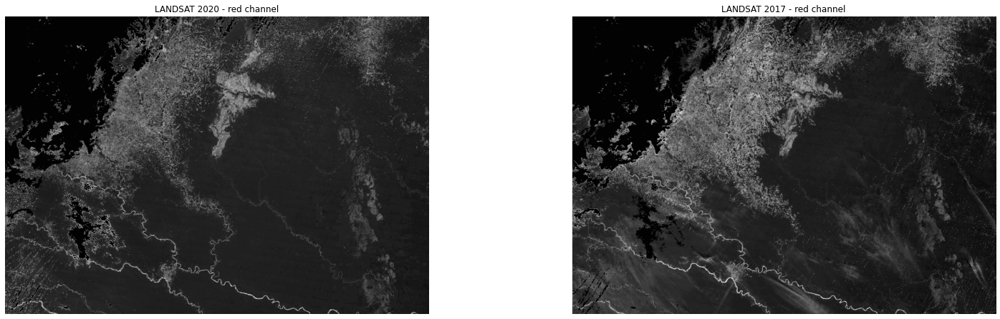

In [443]:
img2000_3 = get_rgb_channels(img2000_2)[0]
img2017_3 = get_rgb_channels(img2017_2)[0]

plt.figure(figsize=(26,26))
plt.subplot(323); plt.imshow(img2000_3, cmap="gray"); plt.axis('off'); plt.title('LANDSAT 2020 - red channel')
plt.subplot(324); plt.imshow(img2017_3, cmap="gray"); plt.axis('off'); plt.title('LANDSAT 2017 - red channel')

The devasted area is considered as the foreground, so all the values below the threshold value found by the OTSU method are set to 0.

Text(0.5, 1.0, 'LANDSAT 2017 - red Channel - OTSU Threshold Filter')

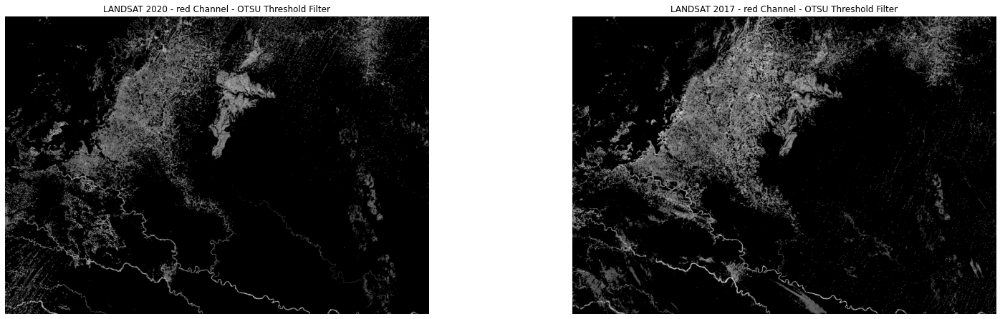

In [444]:
thresh = threshold_otsu(img2000_3)
img2000_4 = np.array(img2000_3, copy=True)
img2000_4[img2000_4 < thresh] = 0

thresh = threshold_otsu(img2017_3)
img2017_4 = np.array(img2017_3, copy=True)
img2017_4[img2017_4 < thresh] = 0

plt.figure(figsize=(26,26))
plt.subplot(323); plt.imshow(img2000_4, cmap="gray"); plt.axis('off'); plt.title('LANDSAT 2020 - red Channel - OTSU Threshold Filter')
plt.subplot(324); plt.imshow(img2017_4, cmap="gray"); plt.axis('off'); plt.title('LANDSAT 2017 - red Channel - OTSU Threshold Filter')

### Segmentation using the **green** channel

Text(0.5, 1.0, 'LANDSAT 2017 - green channel')

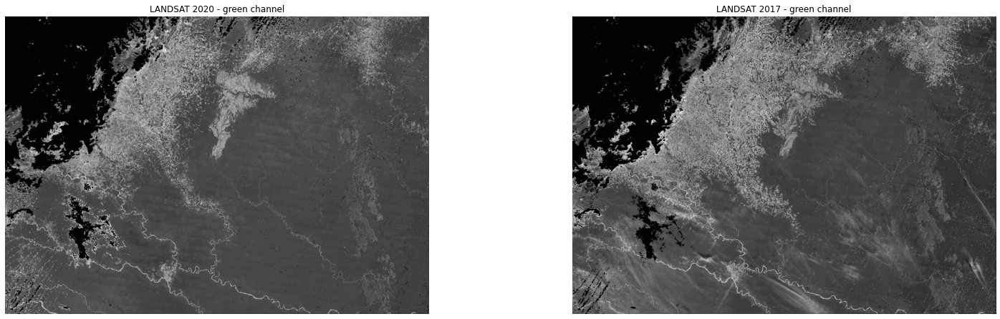

In [445]:
img2000_3 = get_rgb_channels(img2000_2)[1]
img2017_3 = get_rgb_channels(img2017_2)[1]

plt.figure(figsize=(26,26))
plt.subplot(323); plt.imshow(img2000_3, cmap="gray"); plt.axis('off'); plt.title('LANDSAT 2020 - green channel')
plt.subplot(324); plt.imshow(img2017_3, cmap="gray"); plt.axis('off'); plt.title('LANDSAT 2017 - green channel')

Text(0.5, 1.0, 'LANDSAT 2017 - green channel - OTSU Threshold Filter')

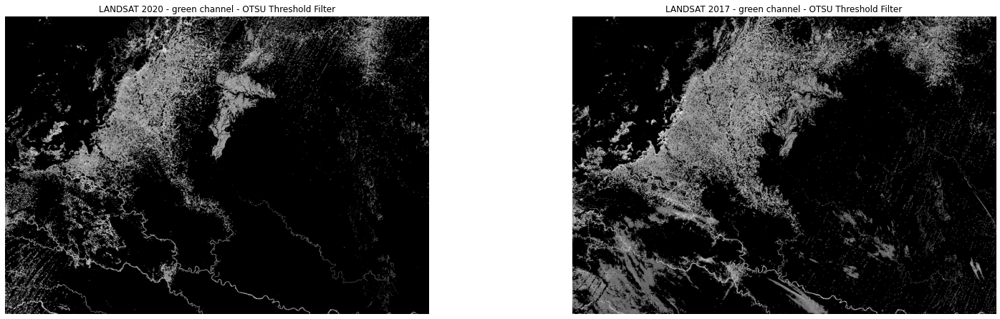

In [446]:
thresh = threshold_otsu(img2000_3)
img2000_4 = np.array(img2000_3, copy=True)
img2000_4[img2000_4 < thresh] = 0

thresh = threshold_otsu(img2017_3)
img2017_4 = np.array(img2017_3, copy=True)
img2017_4[img2017_4 < thresh] = 0

plt.figure(figsize=(26,26))
plt.subplot(323); plt.imshow(img2000_4, cmap="gray"); plt.axis('off'); plt.title('LANDSAT 2020 - green channel - OTSU Threshold Filter')
plt.subplot(324); plt.imshow(img2017_4, cmap="gray"); plt.axis('off'); plt.title('LANDSAT 2017 - green channel - OTSU Threshold Filter')

### Segmentation using the **blue** channel

Text(0.5, 1.0, 'LANDSAT 2017 - blue channel')

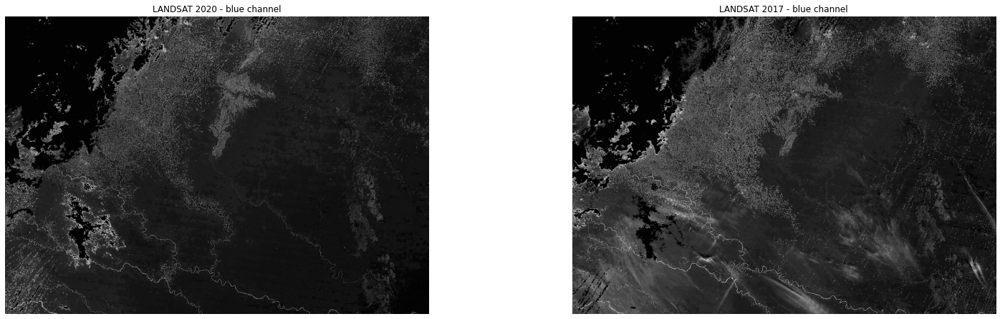

In [447]:
img2000_3 = get_rgb_channels(img2000_2)[2]
img2017_3 = get_rgb_channels(img2017_2)[2]

plt.figure(figsize=(26,26))
plt.subplot(323); plt.imshow(img2000_3, cmap="gray"); plt.axis('off'); plt.title('LANDSAT 2020 - blue channel')
plt.subplot(324); plt.imshow(img2017_3, cmap="gray"); plt.axis('off'); plt.title('LANDSAT 2017 - blue channel')

Text(0.5, 1.0, 'LANDSAT 2017 - blue channel - OTSU Threshold Filter')

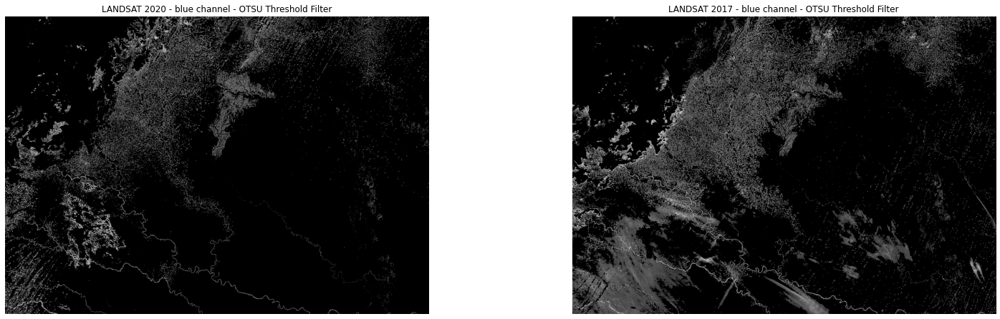

In [448]:
thresh = threshold_otsu(img2000_3)
img2000_4 = np.array(img2000_3, copy=True)
img2000_4[img2000_4 < thresh] = 0

thresh = threshold_otsu(img2017_3)
img2017_4 = np.array(img2017_3, copy=True)
img2017_4[img2017_4 < thresh] = 0

plt.figure(figsize=(26,26))
plt.subplot(323); plt.imshow(img2000_4, cmap="gray"); plt.axis('off'); plt.title('LANDSAT 2020 - blue channel - OTSU Threshold Filter')
plt.subplot(324); plt.imshow(img2017_4, cmap="gray"); plt.axis('off'); plt.title('LANDSAT 2017 - blue channel - OTSU Threshold Filter')

### Segmentation using the **gray scale mode**

Text(0.5, 1.0, 'LANDSAT 2017 - gray scale mode')

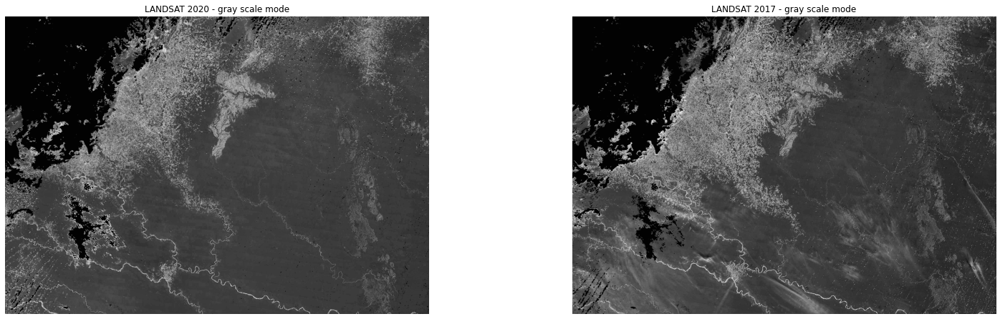

In [449]:
img2000_3 = color.rgb2gray(img2000_2)
img2017_3 = color.rgb2gray(img2017_2)

plt.figure(figsize=(26,26))
plt.subplot(323); plt.imshow(img2000_3, cmap="gray"); plt.axis('off'); plt.title('LANDSAT 2020 - gray scale mode')
plt.subplot(324); plt.imshow(img2017_3, cmap="gray"); plt.axis('off'); plt.title('LANDSAT 2017 - gray scale mode')

Text(0.5, 1.0, 'LANDSAT 2017 - gray scale mode - OTSU Threshold Filter')

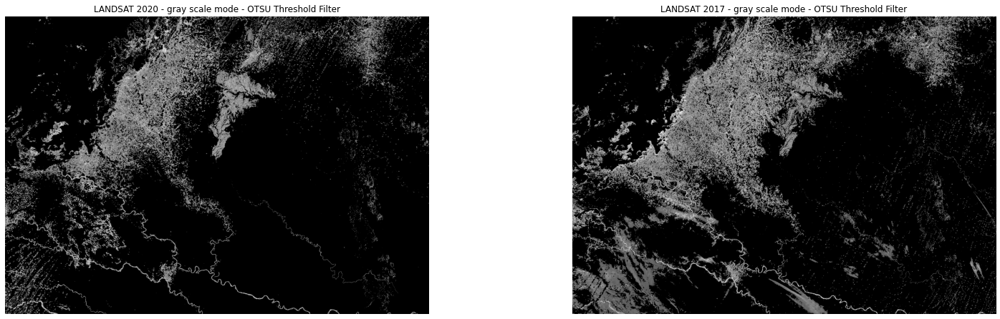

In [450]:
thresh = threshold_otsu(img2000_3)
img2000_4 = np.array(img2000_3, copy=True)
img2000_4[img2000_4 < thresh] = 0

thresh = threshold_otsu(img2017_3)
img2017_4 = np.array(img2017_3, copy=True)
img2017_4[img2017_4 < thresh] = 0

plt.figure(figsize=(26,26))
plt.subplot(323); plt.imshow(img2000_4, cmap="gray"); plt.axis('off'); plt.title('LANDSAT 2020 - gray scale mode - OTSU Threshold Filter')
plt.subplot(324); plt.imshow(img2017_4, cmap="gray"); plt.axis('off'); plt.title('LANDSAT 2017 - gray scale mode - OTSU Threshold Filter')

Analysing the results of each attempt, the red channel is less noisy, so it will be used for the next phase.

In [451]:
img2000_3 = get_rgb_channels(img2000_2)[0]
img2017_3 = get_rgb_channels(img2017_2)[0]

thresh = threshold_otsu(img2000_3)
img2000_4 = np.array(img2000_3, copy=True)
img2000_4[img2000_4 < thresh] = 0

thresh = threshold_otsu(img2017_3)
img2017_4 = np.array(img2017_3, copy=True)
img2017_4[img2017_4 < thresh] = 0

## Phase 3 - Analysis and Estimation
### **Calculates the increase of deforestation**

With the devasted areas in focus on both images, we can subtract them to see the difference in terms of intensity value.

The higher the value in the difference image result, the higher is the devastation represented by the pixel.

Text(0.5, 1.0, 'Difference of images in gray scale')

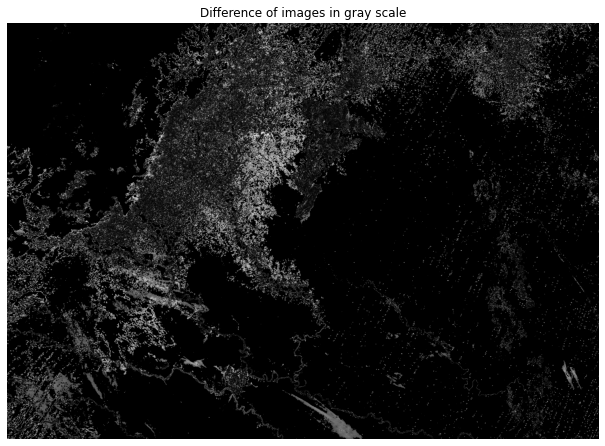

In [452]:
diff =  compare_images(img2017_4, img2000_4, method='diff')
plt.figure(figsize=(26,26))
plt.subplot(323); plt.imshow(diff, cmap="gray"); plt.axis('off'); plt.title('Difference of images in gray scale')

The resulted image is good to detect all possibilities in terms of devastation area growth. For example, let's see how many values are represented in the image.

Remembering that each intensity value represented a percentage of devastation in a pixel, that represents 0.09 ha.

In [453]:
print("Different intensity values in the gray channel: %d" % len(set(diff.flatten())))

Different intensity values in the gray channel: 643835


But for this work, some value ranges are going to be delimited to define only 11 levels of deforestation.

1.   Not analysed - 0% Deforestation - Black Pixels
2.   10% Deforestation - pixel values in the first gray scale - 0,0009 ha deforasted per pixel
3.   20% Deforestation - pixel values in the second gray scale - 0,0018 ha deforasted per pixel
4.   30% Deforestation - pixel values in the third gray scale - 0,0027 ha deforasted per pixel
5.   40% Deforestation - pixel values in the fourth gray scale - 0,0036 ha deforasted per pixel
6.   50% Deforestation - pixel values in the fifth gray scale - 0,0045 ha deforasted per pixel
7.   60% Deforestation - pixel values in the sixth gray scale - 0,0054 ha deforasted per pixel
8.   70% Deforestation - pixel values in the seventh gray scale - 0,0063 ha deforasted per pixel
9.   80% Deforestation - pixel values in the eighth gray scale - 0,0072 ha deforasted per pixel
10.   90% Deforestation - pixel values in the nineth gray scale - 0,0081 ha deforasted per pixel
11.   100% Deforestation - pixel values in the tenth gray scale - 0,009 ha deforasted per pixel

To achieve that, the K-Means clustering method is applied. The method quantifies values in a range and group them into separate clusters where each pixel is nearer to.

The k-means is used here to group the pixels in 11 different levels, or colors.

Different intensity values in the gray channel: 11


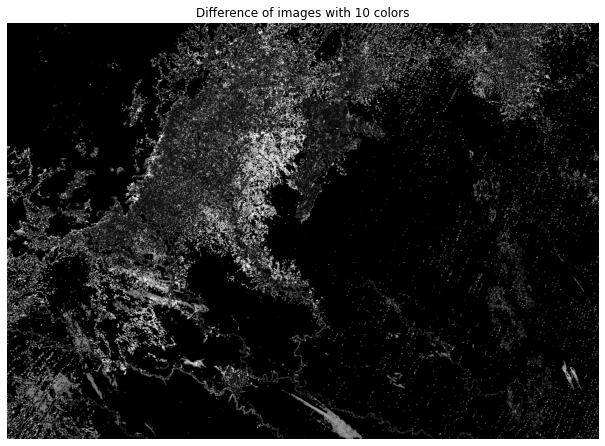

In [454]:
diff = np.array(diff, dtype=np.float64) / 255
image_array = diff.reshape((-1, 1))
kmeans = KMeans(n_clusters=11, random_state=0)
kmeans.fit(image_array)

diff10 = np.choose(kmeans.labels_, kmeans.cluster_centers_.squeeze())
diff10.shape = diff.shape

plt.figure(figsize=(26,26))
plt.subplot(323); plt.imshow(diff10, cmap="gray"); plt.axis('off'); plt.title('Difference of images with 10 colors')
print("Different intensity values in the gray channel: %d" % len(set(diff10.flatten())))

With the image ready to be analysed, the number of pixels in each cluster (or each intensity value) can be used to estimate the deforastation growth.

The histogram below shows the number of pixels with each value.

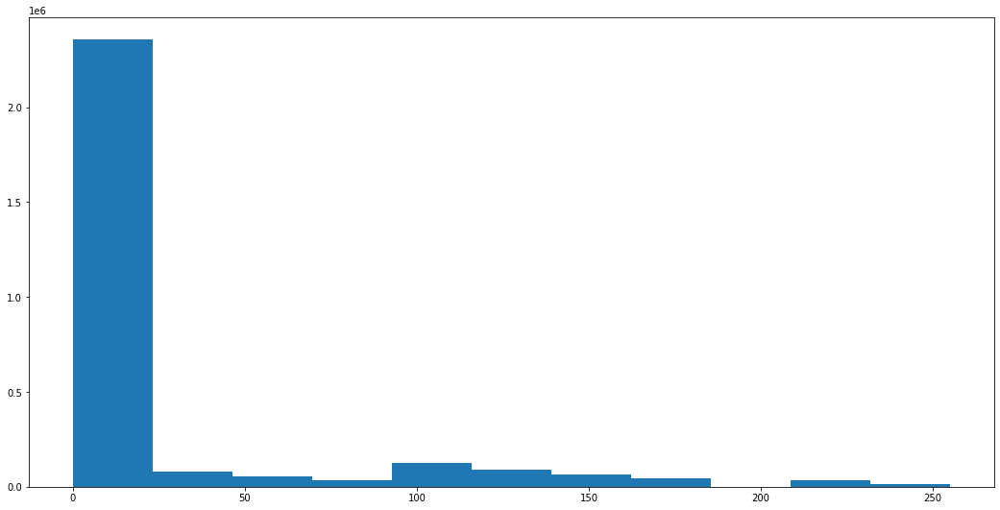

Deforastation of 0%: (intensity = 0, count = 2358074, ha = 0.00)
Deforastation of 10%: (intensity = 23, count = 78041, ha = 702.37)
Deforastation of 20%: (intensity = 46, count = 56262, ha = 1012.72)
Deforastation of 30%: (intensity = 69, count = 35750, ha = 965.25)
Deforastation of 40%: (intensity = 92, count = 123431, ha = 4443.52)
Deforastation of 50%: (intensity = 115, count = 87753, ha = 3948.89)
Deforastation of 60%: (intensity = 139, count = 62552, ha = 3377.81)
Deforastation of 70%: (intensity = 162, count = 44706, ha = 2816.48)
Deforastation of 80%: (intensity = 185, count = 0, ha = 0.00)
Deforastation of 90%: (intensity = 208, count = 32655, ha = 2645.06)
Deforastation of 100%: (intensity = 231, count = 16159, ha = 1454.31)

Estimated number of deforested hectares: 21366.39 ha


In [455]:
plt.figure(figsize=(18, 9))
bins = 11
img = img_as_ubyte(exposure.rescale_intensity(diff10))
arr = plt.hist(img.ravel(), bins=bins)
plt.show()

deforestation = np.zeros(bins)
ha_per_pixel = 0.09

for i in range(bins):
  deforestation[i] = arr[0][i] * ha_per_pixel * i * 0.1
  print("Deforastation of %d%%: (intensity = %d, count = %d, ha = %.2f)" % ((i * 10), arr[1][i], arr[0][i], deforestation[i]))

print("\nEstimated number of deforested hectares: %.2f ha" % np.sum(deforestation))